In [211]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.cluster import KMeans, DBSCAN

In [212]:
df = pd.read_csv('../datasets/input/stage.csv')

# Let's work on locations

In [213]:
df.columns

Index(['incident_id', 'date', 'state', 'city_or_county', 'address', 'n_killed',
       'n_injured', 'incident_url', 'source_url',
       'incident_url_fields_missing', 'congressional_district', 'gun_stolen',
       'gun_type', 'incident_characteristics', 'latitude',
       'location_description', 'longitude', 'n_guns_involved', 'notes',
       'participant_age', 'participant_age_group', 'participant_gender',
       'participant_name', 'participant_relationship', 'participant_status',
       'participant_type', 'sources', 'state_house_district',
       'state_senate_district'],
      dtype='object')

In [214]:
df.source_url

0         http://www.post-gazette.com/local/south/2013/0...
1         http://www.dailybulletin.com/article/zz/201301...
2         http://chronicle.northcoastnow.com/2013/02/14/...
3         http://www.dailydemocrat.com/20130106/aurora-s...
4         http://www.journalnow.com/news/local/article_d...
                                ...                        
239672    http://www.klfy.com/news/local/rayne-woman-cha...
239673    http://www.ksla.com/story/37854648/man-wanted-...
239674    http://www.nola.com/crime/index.ssf/2018/04/sh...
239675    https://www.chron.com/news/houston-texas/houst...
239676    https://www.centralmaine.com/2018/03/31/police...
Name: source_url, Length: 239677, dtype: object

In [215]:
df.n_injured.value_counts()

n_injured
0     142487
1      81986
2      11484
3       2513
4        760
5        241
6         91
7         51
8         19
9         12
10         6
12         5
11         4
19         3
14         3
13         2
16         2
15         2
17         2
18         1
53         1
25         1
20         1
Name: count, dtype: int64

In [216]:
df.isna().sum()

incident_id                         0
date                                0
state                               0
city_or_county                      0
address                         16497
n_killed                            0
n_injured                           0
incident_url                        0
source_url                        468
incident_url_fields_missing         0
congressional_district          11944
gun_stolen                      99498
gun_type                        99451
incident_characteristics          326
latitude                         7923
location_description           197588
longitude                        7923
n_guns_involved                 99451
notes                           81017
participant_age                 92298
participant_age_group           42119
participant_gender              36362
participant_name               122253
participant_relationship       223903
participant_status              27626
participant_type                24863
sources     

In [217]:
# to datetime
df['date'] = pd.to_datetime(df['date'])

In [18]:
df.columns

Index(['incident_id', 'date', 'state', 'city_or_county', 'address', 'n_killed',
       'n_injured', 'incident_url', 'source_url',
       'incident_url_fields_missing', 'congressional_district', 'gun_stolen',
       'gun_type', 'incident_characteristics', 'latitude',
       'location_description', 'longitude', 'n_guns_involved', 'notes',
       'participant_age', 'participant_age_group', 'participant_gender',
       'participant_name', 'participant_relationship', 'participant_status',
       'participant_type', 'sources', 'state_house_district',
       'state_senate_district'],
      dtype='object')

In [19]:
df.notes

0         Julian Sims under investigation: Four Shot and...
1         Four Shot; One Killed; Unidentified shooter in...
2                                                       NaN
3                                                       NaN
4         Two firearms recovered. (Attempted) murder sui...
                                ...                        
239672                                                  NaN
239673                                                  NaN
239674                                                  NaN
239675    Vic was found shot to death in car on 4/1/18, ...
239676    ALT: US 2, shot wife then self, handgun, shotg...
Name: notes, Length: 239677, dtype: object

In [20]:
# keeping incident id for future possible concats
df_loc = df[['latitude', 'longitude', 'state', 'incident_id', 'n_killed', 'n_injured', 'date', 'incident_url']]

In [21]:
df_loc.isna().sum()

latitude        7923
longitude       7923
state              0
incident_id        0
n_killed           0
n_injured          0
date               0
incident_url       0
dtype: int64

In [22]:
df_loc.dropna(inplace=True)

/var/folders/jc/4yc2h6tx38z5blxyhzq79dlr0000gn/T/ipykernel_34257/3313519909.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_loc.dropna(inplace=True)


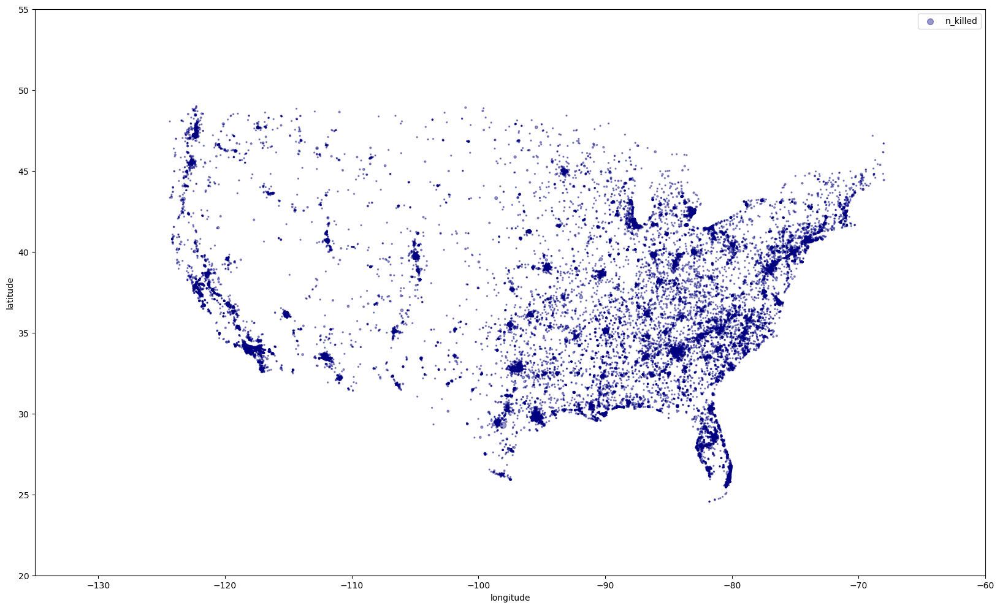

In [25]:
df_loc.plot(kind='scatter', x='longitude', y='latitude', alpha=0.4, figsize=(20,12), s = df_loc['n_killed']*2, label='n_killed', color = 'navy');
plt.xlim(-135, -60);
plt.ylim(20, 55);

In [26]:
(df_loc.n_killed!=0).sum()

50838

In [178]:
df_loc.columns

Index(['latitude', 'longitude', 'state', 'incident_id', 'n_killed',
       'n_injured', 'date', 'incident_url', 'cluster'],
      dtype='object')

In [199]:
df_loc.shape

(231754, 9)

In [181]:
# CLUSTERING WITH DBSCAN FOR EACH STATE SEPARATELY

# we should drop everything to concat on incident_id after clustering
df_dbs = df_loc[['latitude', 'longitude', 'state', 'incident_id']]

# for relabeling the clusters
def labels_gen(i=0):
    while True:
        yield i
        i += 1

gen_init = labels_gen(0)

eps = 0.1
min_samples = 10

combined_data = []
for state, state_data in df_dbs.groupby('state'):

    # we should drop everything 
    data = state_data.drop(columns=['state', 'incident_id'])
    
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    dbscan.fit(data)

    # reorder the labels to start from the last label, except for -1
    labels = dbscan.labels_
    state_data['cluster'] = labels
    labels_map = {label:( next(gen_init) if label != -1 else -1) for label in set(labels)}    
    state_data['cluster'] = state_data['cluster'].map(labels_map)
    
    combined_data.append(state_data)

final_combined_data = pd.concat(combined_data)

# merge on incident_id only clusters
try:
    df_loc.drop(columns=['cluster'], inplace=True)
except KeyError:
    pass

df_loc = df_loc.merge(final_combined_data[['incident_id', 'cluster']], on='incident_id')

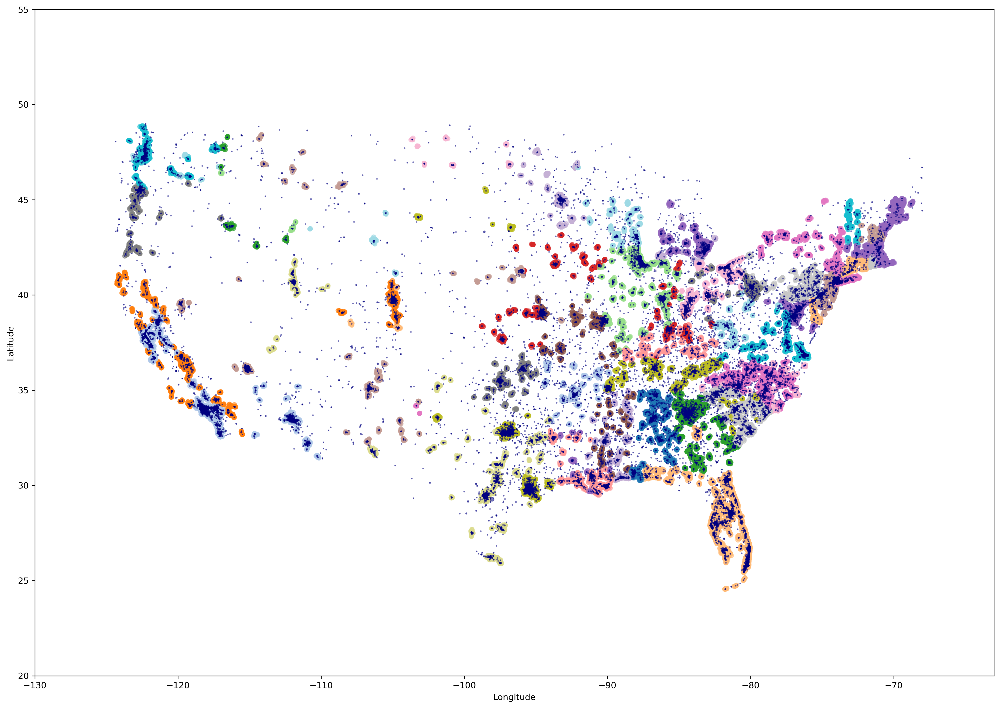

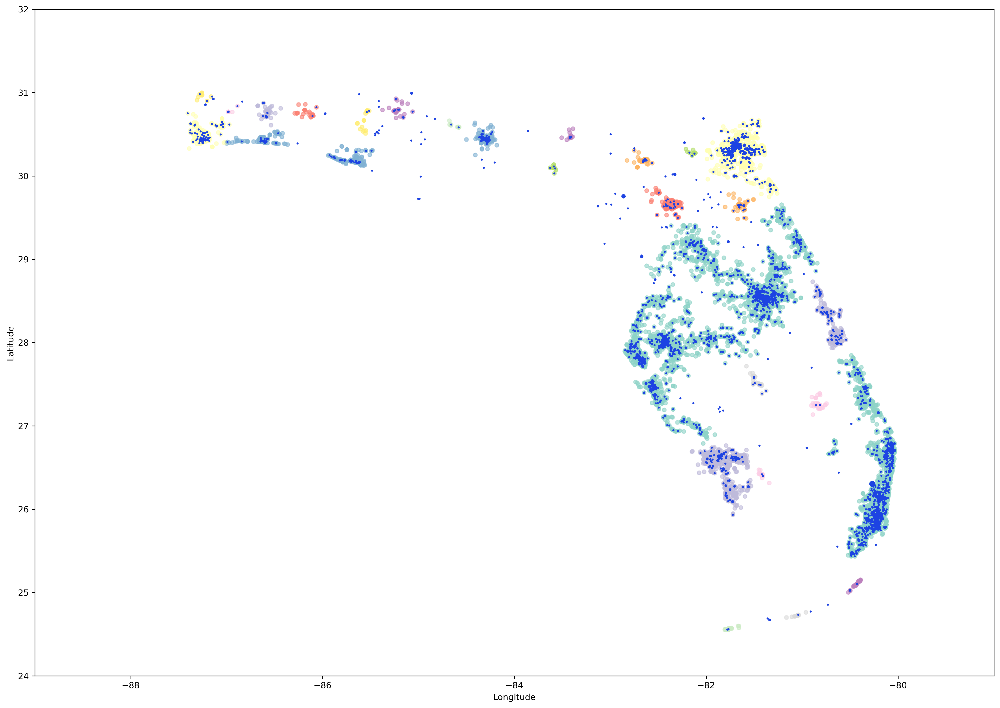

In [204]:
# PLOTTING DBSCAN CLUSTERS. BLUE DOTS ON MAP ARE INCIDENTS WITH KILLED VICITIMS 

# map -1 to NaN
df_loc['cluster'] = df_loc['cluster'].replace(-1, np.nan)
# plot USA
plt.figure(figsize=(20, 14), dpi=300)
plt.scatter(df_loc['longitude'], df_loc['latitude'], c=df_loc['cluster'], cmap='tab20', alpha=0.6, s=25)
plt.scatter(df_loc['longitude'], df_loc['latitude'], s=df_loc['n_killed']*0.7, alpha=0.5, label='n_killed', color='navy')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.xlim(-130, -63)
plt.ylim(20, 55)
plt.show()

# plot for florida
florida = df_loc[df_loc['state']=='Florida']
plt.figure(figsize=(20, 14), dpi=300)
plt.scatter(florida['longitude'], florida['latitude'], c=florida['cluster'], cmap='Set3', alpha=0.6, s=20)
plt.scatter(florida['longitude'], florida['latitude'], alpha=1, label='n_killed', color='#1D43E2', s=florida['n_killed']*2)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.xlim(-89, -79)
plt.ylim(24, 32)

# back to -1
df_loc['cluster'] = df_loc['cluster'].replace(np.nan, -1)

In [174]:
# how many clusters are there within NY?
nyc = df_loc[(df_loc['longitude'] > -74.3) & (df_loc['longitude'] < -73.6) & (df_loc['latitude'] > 40.4) & (df_loc['latitude'] < 41)]
nyc['cluster'].nunique()

3

Note: no -1 cluster in there!

/var/folders/jc/4yc2h6tx38z5blxyhzq79dlr0000gn/T/ipykernel_34257/1412274889.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nyc['cluster'] = nyc['cluster'].astype('int')


(40.4, 41.0)

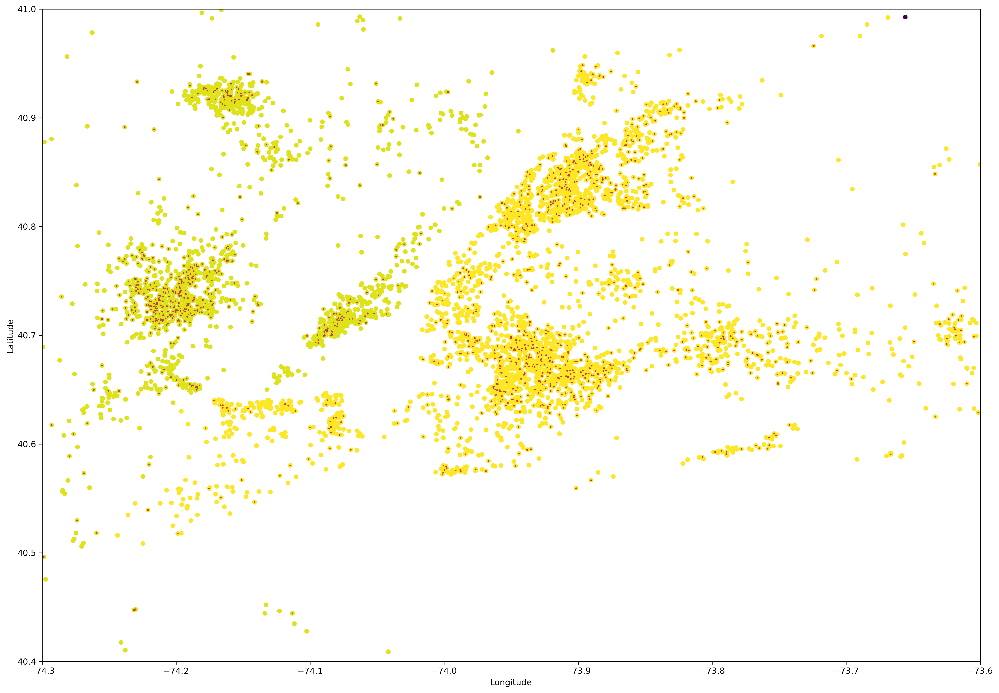

In [175]:
# PLOTTING NYC CLUSTERS (only 3), BLUE DOTS ON MAP ARE INCIDENTS WITH KILLED VICITIMS

nyc['cluster'] = nyc['cluster'].astype('int')
plt.figure(figsize=(20, 14), dpi=300)
plt.scatter(nyc['longitude'], nyc['latitude'], c=nyc['cluster'], s=20)
plt.scatter(nyc['longitude'], nyc['latitude'], s=nyc['n_killed']*0.8, alpha=1, label='n_killed', color='#C13E43')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.xlim(-74.3, -73.6)
plt.ylim(40.4, 41)

New Jersey and NYC are separated well

In [140]:
#number of clusters
df_loc.cluster.nunique()

949

### Try using KMEANS?

/var/folders/jc/4yc2h6tx38z5blxyhzq79dlr0000gn/T/ipykernel_30386/21542348.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



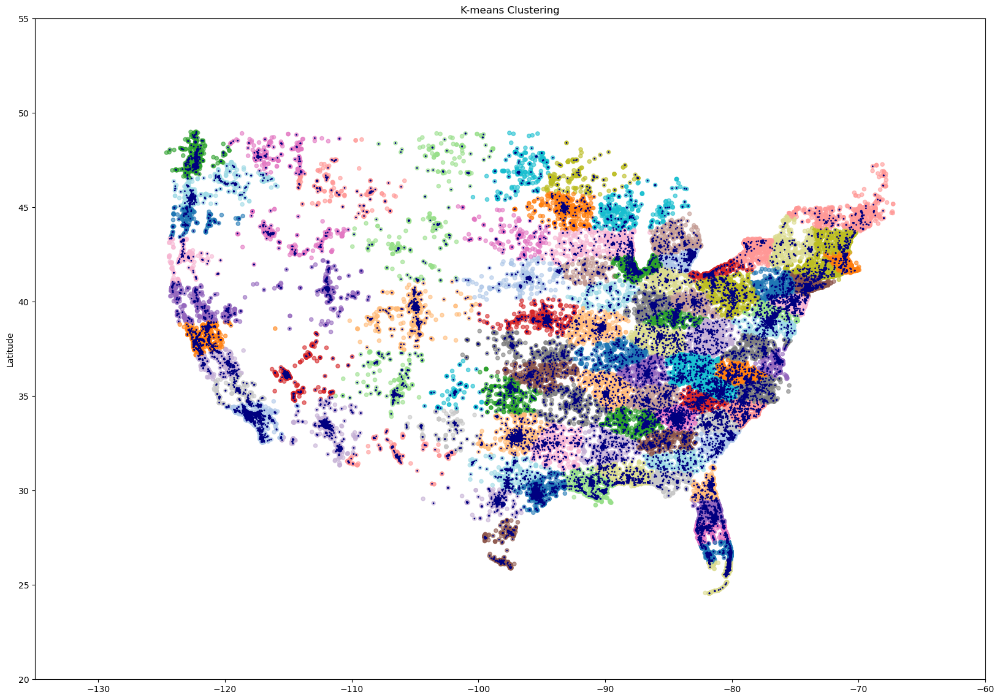

In [102]:
# KMEANS 101
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_loc[['longitude', 'latitude']])

optimal_k = 101
kmeans = KMeans(n_clusters=optimal_k)
df_loc['cluster'] = kmeans.fit_predict(scaled_data)

plt.figure(figsize=(20, 14))
plt.scatter(df_loc['longitude'], df_loc['latitude'], c=df_loc['cluster'], cmap='tab20', alpha= 0.6, s = 20)
plt.scatter(df_loc['longitude'], df_loc['latitude'], s=df_loc['n_killed'], alpha=1, label='n_killed', color='navy')
plt.ylabel('Latitude')
plt.title('K-means Clustering')
plt.xlim(-135, -60);
plt.ylim(20, 55);
plt.show()

python(91719) MallocStackLogging: can't turn off malloc stack logging because it was not enabled.


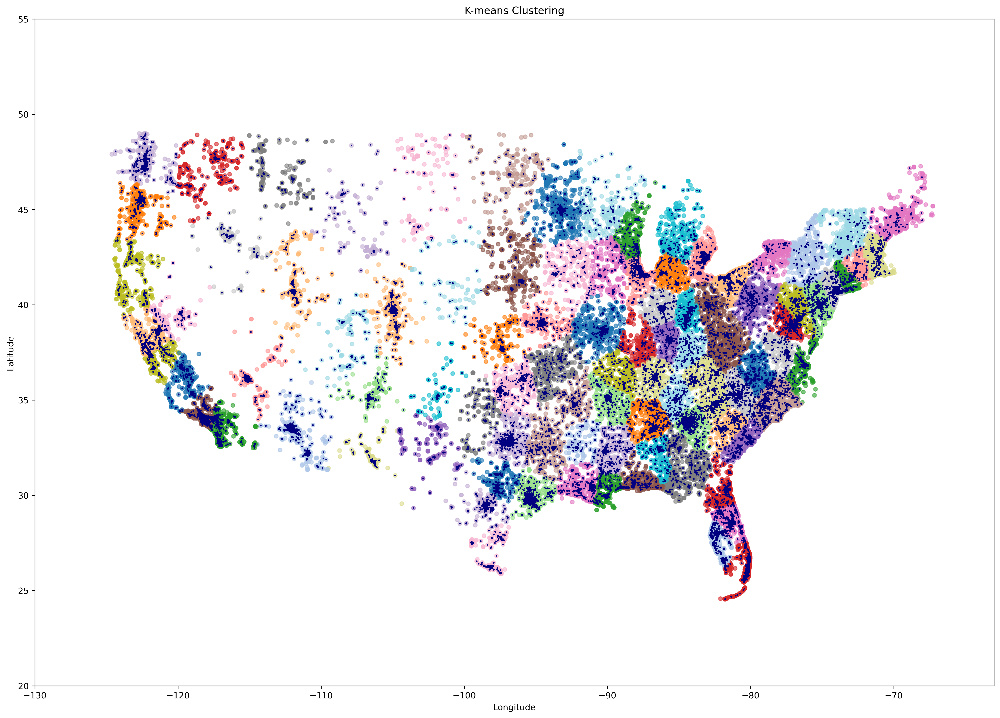

In [179]:
# KMEANS 101 with custom weights

scaled_data = df_loc[['longitude', 'latitude']].values
weights = (df_loc['n_killed']).values
weighted_scaled_data = np.repeat(scaled_data, weights, axis=0)

optimal_k = 101 

kmeans = KMeans(n_clusters=optimal_k, random_state=0)
kmeans.fit(weighted_scaled_data)

df_loc['cluster'] = kmeans.predict(scaled_data)

plt.figure(figsize=(20, 14), dpi=300)
plt.scatter(df_loc['longitude'], df_loc['latitude'], c=df_loc['cluster'], cmap='tab20', alpha=0.6, s=20)
plt.scatter(df_loc['longitude'], df_loc['latitude'], s=df_loc['n_killed']*0.8, alpha=1, label='n_killed', color='navy')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('K-means Clustering')
plt.xlim(-130, -63)
plt.ylim(20, 55)
plt.show()

### Saving df for further modelling

In [218]:
df_loc.shape, df.shape

((231754, 9), (239677, 29))

In [220]:
# Right concat on initial df
df_res = pd.merge(df, df_loc[['incident_id', 'cluster']], on='incident_id', how='right')

In [221]:
df_res.shape

(231754, 30)

In [222]:
df_res.columns

Index(['incident_id', 'date', 'state', 'city_or_county', 'address', 'n_killed',
       'n_injured', 'incident_url', 'source_url',
       'incident_url_fields_missing', 'congressional_district', 'gun_stolen',
       'gun_type', 'incident_characteristics', 'latitude',
       'location_description', 'longitude', 'n_guns_involved', 'notes',
       'participant_age', 'participant_age_group', 'participant_gender',
       'participant_name', 'participant_relationship', 'participant_status',
       'participant_type', 'sources', 'state_house_district',
       'state_senate_district', 'cluster'],
      dtype='object')

In [223]:
df_res.to_csv('../datasets/output/clustered.csv', index=False)